In [311]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.tri as tri
from sklearn.metrics.pairwise import cosine_distances
from scipy.spatial.distance import pdist, cosine
from scipy.cluster.hierarchy import linkage, optimal_leaf_ordering, dendrogram, leaves_list
import seaborn as sns
from scipy.stats import gaussian_kde
from openTSNE import TSNE

original = "baseline"
channels = ["DNA", "RNA", "AGP", "ER", "Mito"]
colors = ['#808080', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

f_cols = list(map(str, range(672)))

In [312]:
# Edit: DNA has lower number of rows

baseline_features_ = pd.read_csv(f"features/{original}_wells.csv")
channel_features_ = {ch: pd.read_csv(f"features/{ch}_wells.csv") for ch in channels}

common_columns = ["Plate", "Well", "Treatment", "Replicate", "broad_sample"]

for ch in channels[1:]:
    channel_features_[ch] = pd.merge(channel_features_[ch], channel_features_['DNA'][common_columns], on=common_columns, how='inner')

baseline_features_ = pd.merge(baseline_features_, channel_features_['DNA'][common_columns], on=common_columns, how='inner')

baseline_features = baseline_features_[f_cols]
channel_features = {ch: f[f_cols] for ch, f in channel_features_.items()}

# MoA

## Mean aggregation of well-level features by broad_sample and matched with MoA

In [313]:
# Read MoA matches
moa_matches = pd.read_csv('../BBBC022_MOA_MATCHES_official.csv')

def moa_aggregate(wells):
    profiles = wells.copy()
    # Create new column 'brd': Remove XXX-XX-X from broad_sample. Example: BRD-K98763141-001-06-8 -> BRD-K98763141
    profiles['brd'] = profiles['broad_sample'].apply(lambda x: "-".join(x.split("-")[:2]))

    # Clean up
    profiles = profiles.drop(columns=['Plate', 'Well', 'Treatment', 'Replicate', 'broad_sample'])

    # Aggregate profiles by 'brd'
    profiles = profiles.groupby('brd').mean().reset_index()

    # Merge with MoA Matches
    profiles = pd.merge(profiles, moa_matches, left_on='brd', right_on='Var1', how='left')

    # Clean up
    profiles = profiles.drop(columns=['Var1'])
    profiles.rename(columns={'Metadata_moa.x': 'MoA'}, inplace=True)
    profiles = profiles.sort_values(by='MoA', ignore_index=True)

    return profiles

baseline_features_brd = moa_aggregate(baseline_features_)
channel_features_brd = {ch: moa_aggregate(ch_f) for ch, ch_f in channel_features_.items()}

In [314]:
# Remove broad_samples with NaN MoA (broad_sample is not in BBBC022_MOA_MATCHES_official.csv)
print("Broad samples with no MoA:", baseline_features_brd['MoA'].isna().sum(), "/", len(baseline_features_brd))

baseline_features_brd = baseline_features_brd.dropna(axis=0)
channel_features_brd = {ch: ch_df.dropna(axis=0) for ch, ch_df in channel_features_brd.items()}

baseline_features_brd


Broad samples with no MoA: 547 / 1542


,brd,0,1,2,3,4,5,6,7,8,...,663,664,665,666,667,668,669,670,671,MoA
0,BRD-A07824748,-0.046536,-0.254476,-0.116213,-0.035379,-0.135252,0.234139,0.152789,-0.060437,0.208227,...,0.907577,0.044643,0.718303,-0.135406,0.020255,-0.198355,0.230942,-0.103660,-0.090515,11-beta hydroxysteroid dehydrogenase inhibitor
1,BRD-K58685305,0.013754,-0.132481,0.160636,-0.029929,-0.003252,0.092835,0.024089,-0.006781,0.046433,...,0.162071,0.002935,0.466774,0.284857,-0.130627,0.260992,0.038273,-0.072574,0.003148,11-beta hydroxysteroid dehydrogenase inhibitor
2,BRD-K88366685,-0.080377,0.046593,0.103224,0.014573,0.207934,-0.055747,0.094488,0.057018,-0.088058,...,0.152001,0.104063,0.161518,0.053374,0.018322,-0.186021,-0.094103,-0.058942,0.156799,3-ketoacyl coa thiolase inhibitor
3,BRD-K01095011,0.048283,-0.087412,0.290446,-0.022898,-0.082006,0.023044,-0.236547,0.079595,-0.099321,...,0.098043,0.014005,0.485184,0.262303,-0.013691,-0.262497,-0.148844,-0.204834,-0.077143,5 alpha reductase inhibitor
4,BRD-K38251852,0.258097,0.236795,0.077727,0.013505,-0.218057,0.187122,-0.034699,0.070508,-0.069742,...,-0.891441,0.088758,-0.215331,0.192847,0.026804,-0.137694,-0.066045,0.097588,0.136664,abc transporter expression enhancer|high condu...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,BRD-K27316855,0.027195,0.052373,0.300547,-0.006871,0.034622,-0.005322,-0.049280,0.109314,0.066750,...,0.214562,-0.011581,-0.547430,0.127410,-0.041091,0.207068,-0.124497,-0.190345,-0.119141,vitamin d receptor agonist
991,BRD-A65051990,-0.350147,0.006566,0.347590,-0.026483,-0.020880,-0.007168,-0.332734,-0.061847,-0.060592,...,-0.327423,0.027224,0.028603,0.036033,-0.054973,0.448380,-0.121944,-0.078127,0.192683,vitamin k antagonist
992,BRD-K71133585,-0.172905,0.116314,-0.188610,0.014847,0.085995,0.055786,0.158321,-0.013071,0.103167,...,-0.147106,-0.009982,0.297445,-0.019590,0.068172,-0.117026,-0.037436,0.049138,0.068445,vitamin k antagonist
993,BRD-K23913458,-0.160760,0.212924,0.089737,-0.018439,-0.025023,0.063584,-0.160826,-0.077720,0.236152,...,-0.315939,-0.053412,-0.825751,0.396570,0.083316,0.006046,0.573023,-0.033007,-0.237643,vitamin k antagonist


30 MoA z največ broad_sampli


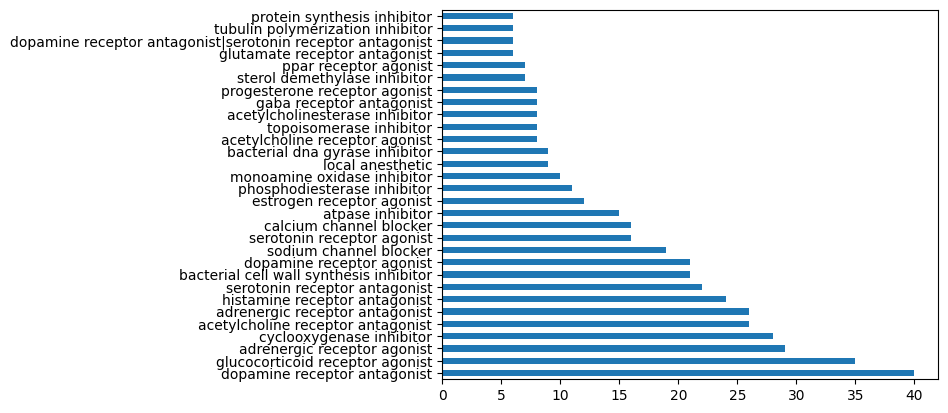

In [315]:
baseline_features_brd['MoA'].value_counts()[:30].plot(kind='barh')
print("30 MoA z največ broad_sampli")

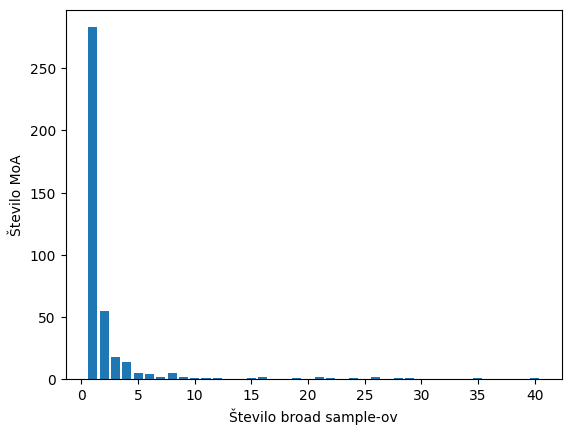

283 MoA : 1 broad_sample
55 MoA : 2 broad_sample


In [316]:
d = dict()

for _, c in baseline_features_brd['MoA'].value_counts().iteritems():
    if c not in d:
        d[c] = 0
    d[c] += 1

plt.bar(list(d.keys()), list(d.values()))
plt.xlabel('Število broad sample-ov')
plt.ylabel('Število MoA')
plt.show()

print(f"{d[1]} MoA : 1 broad_sample")
print(f"{d[2]} MoA : 2 broad_sample")

## Mean aggregation of broad-level features by MoA

In [317]:
baseline_features_moa = baseline_features_brd.groupby('MoA').mean().reset_index()
baseline_features_moa

,MoA,0,1,2,3,4,5,6,7,8,...,662,663,664,665,666,667,668,669,670,671
0,11-beta hydroxysteroid dehydrogenase inhibitor,-0.016391,-0.193479,0.022211,-0.032654,-0.069252,0.163487,0.088439,-0.033609,0.127330,...,0.011519,0.534824,0.023789,0.592538,0.074726,-0.055186,0.031318,0.134608,-0.088117,-0.043683
1,3-ketoacyl coa thiolase inhibitor,-0.080377,0.046593,0.103224,0.014573,0.207934,-0.055747,0.094488,0.057018,-0.088058,...,-0.090702,0.152001,0.104063,0.161518,0.053374,0.018322,-0.186021,-0.094103,-0.058942,0.156799
2,5 alpha reductase inhibitor,0.048283,-0.087412,0.290446,-0.022898,-0.082006,0.023044,-0.236547,0.079595,-0.099321,...,0.011433,0.098043,0.014005,0.485184,0.262303,-0.013691,-0.262497,-0.148844,-0.204834,-0.077143
3,abc transporter expression enhancer|high condu...,0.258097,0.236795,0.077727,0.013505,-0.218057,0.187122,-0.034699,0.070508,-0.069742,...,0.045749,-0.891441,0.088758,-0.215331,0.192847,0.026804,-0.137694,-0.066045,0.097588,0.136664
4,acat inhibitor,-0.093617,0.359128,0.129766,-0.030362,0.110033,0.048073,0.265810,-0.032445,0.192000,...,-0.043728,0.037629,-0.078063,0.047703,0.070165,0.050770,-0.008855,-0.088710,-0.118481,-0.014272
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
400,uricosuric blocker,0.038108,0.026989,0.105421,0.005241,0.034698,-0.049468,0.011089,0.016936,0.148988,...,0.049301,-0.092203,-0.028795,-0.261760,0.033933,0.019061,-0.074345,0.028382,0.045754,-0.009793
401,vasodilator,-0.125773,0.059290,0.187213,0.009865,0.004082,-0.054157,-0.124689,0.072887,0.062399,...,0.035052,-0.139408,0.037406,-0.278541,-0.169627,0.042052,0.100466,0.012118,-0.015413,0.273913
402,vitamin b,0.062616,0.055890,-0.179247,0.011419,-0.023360,-0.006080,0.081118,0.004508,-0.009942,...,0.030900,-0.181487,-0.023924,-0.223531,-0.084818,-0.017326,0.125943,0.008204,0.071582,-0.164338
403,vitamin d receptor agonist,0.027195,0.052373,0.300547,-0.006871,0.034622,-0.005322,-0.049280,0.109314,0.066750,...,0.040587,0.214562,-0.011581,-0.547430,0.127410,-0.041091,0.207068,-0.124497,-0.190345,-0.119141


In [318]:
d = dict()

for _, name in baseline_features_moa['MoA'].apply(lambda x: x.split()[-1]).iteritems():
    if name not in d:
        d[name] = 0
    d[name] += 1

print("Total last words of MoA:", len(d))

print("Last word of Moa     Count")
for name, c in sorted(d.items(), key=lambda x: x[1], reverse=True)[:20]:
    print(f"{name:<{20}} {c}")

Total last words of MoA: 78
Last word of Moa     Count
inhibitor            185
antagonist           44
agonist              41
activator            20
blocker              17
modulator            7
stimulant            6
antiepileptic        3
alkaloid             3
proteins             3
antidepressant       3
metabolite           2
ligand               2
secretagogue         2
inducer              2
diuretic             2
hormone              2
sult2b1              1
analgesic            1
anthelmintic         1


# Info

- 5 eksperimentov (profiliranje). Za vsako profiliranje je za specifičen kanal uporabljena **zamegljena** (blurred) povprečna slika (povprečje pixlov kanala v datasetu).

## t-SNE - t-distributed Stochastic Neighbor Embedding
- Nonlinear dimensionality reduction
- Implemented with [openTSNE](https://opentsne.readthedocs.io/en/latest/index.html#)

```perplexity```: number of nearest neighbors for each point

```early_exaggeration```: control tightness with which t-SNE will try to keep points together in the map space, higher value results in clusters more tightly drawn together

```n_iter```: number of iterations for optimization

In [ ]:
chnls = ["AGP", "Mito", "RNA", "ER", "DNA"]

open_tsne = TSNE()
tsne_embeddings = dict()
bt = open_tsne.fit(np.array(baseline_features))

for ch, f in channel_features.items():
    tsne_embeddings[ch] = bt.transform(np.array(f))

In [319]:
# Broad sample

tsne_brd = TSNE()
tsne_embeddings_brd = dict()
bt_brd = tsne_brd.fit(np.array(baseline_features_brd[f_cols]))

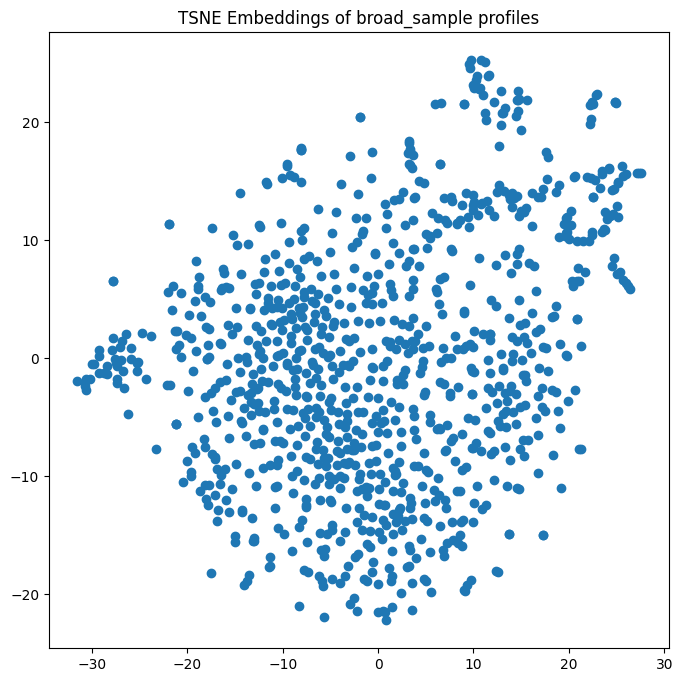

In [320]:
plt.figure(figsize=(8,8))
plt.scatter(bt_brd[:, 0], bt_brd[:, 1])
plt.title("TSNE Embeddings of broad_sample profiles")
plt.show()

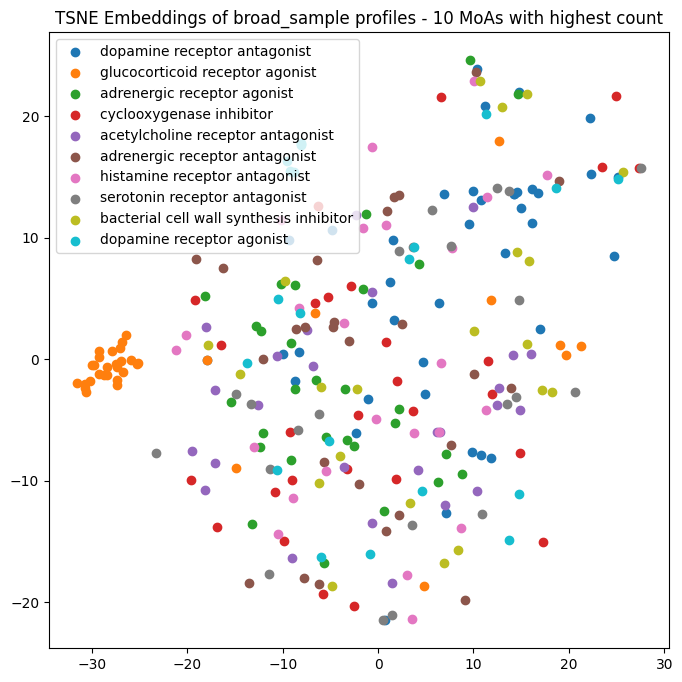

In [321]:
plt.figure(figsize=(8,8))
for name, _ in baseline_features_brd['MoA'].value_counts()[:10].iteritems():
    indices = baseline_features_brd.index[baseline_features_brd['MoA'] == name].to_list()
    plt.scatter(bt_brd[indices, 0], bt_brd[indices, 1], label=name)

plt.legend()
plt.title("TSNE Embeddings of broad_sample profiles - 10 MoAs with highest count")
plt.show()

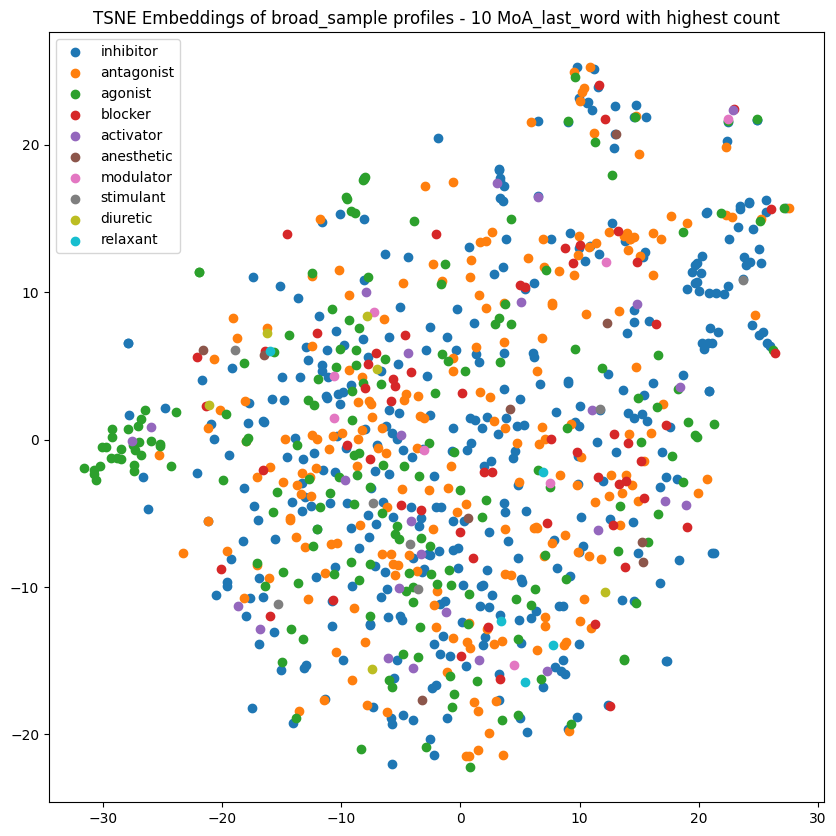

In [322]:
baseline_features_brd['MoA'].apply(lambda x: x.split()[-1]).value_counts()[:10].iteritems()

plt.figure(figsize=(10,10))
for name, _ in baseline_features_brd['MoA'].apply(lambda x: x.split()[-1]).value_counts()[:10].iteritems():
    indices = baseline_features_brd.index[baseline_features_brd['MoA'].apply(lambda x: x.split()[-1]) == name].to_list()
    plt.scatter(bt_brd[indices, 0], bt_brd[indices, 1], label=name)

plt.legend()
plt.title("TSNE Embeddings of broad_sample profiles - 10 MoA_last_word with highest count")
plt.show()

In [323]:
# Moa

tsne_moa = TSNE()
tsne_embeddings_moa = dict()
bt_moa = tsne_moa.fit(np.array(baseline_features_moa[f_cols]))

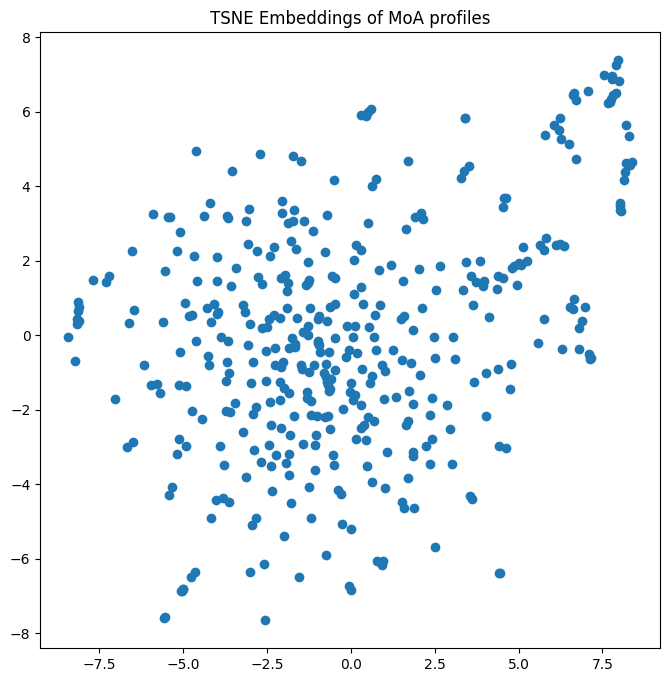

In [324]:
plt.figure(figsize=(8,8))
plt.scatter(bt_moa[:, 0], bt_moa[:, 1])
plt.title("TSNE Embeddings of MoA profiles")
plt.show()

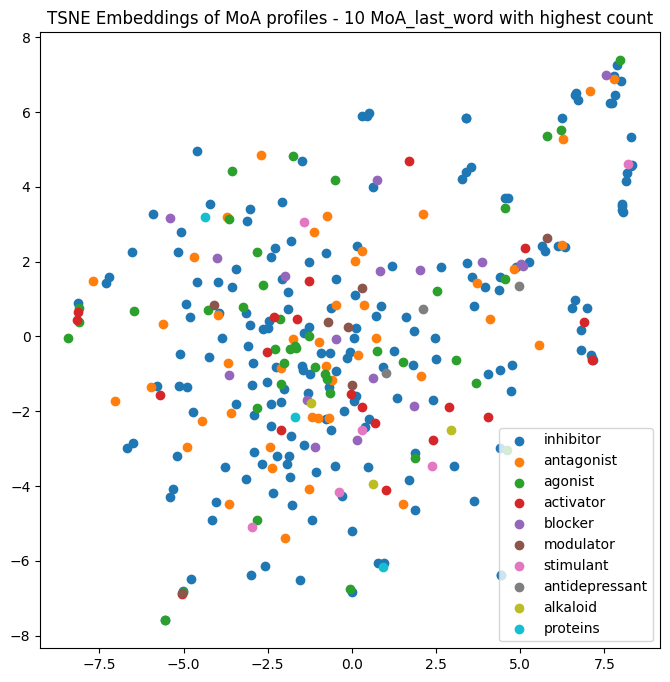

In [325]:
plt.figure(figsize=(8,8))
for name, _ in baseline_features_moa['MoA'].apply(lambda x: x.split()[-1]).value_counts()[:10].iteritems():
    indices = baseline_features_moa.index[baseline_features_moa['MoA'].apply(lambda x: x.split()[-1]) == name].to_list()
    plt.scatter(bt_moa[indices, 0], bt_moa[indices, 1], label=name)

plt.legend()
plt.title("TSNE Embeddings of MoA profiles - 10 MoA_last_word with highest count")
plt.show()


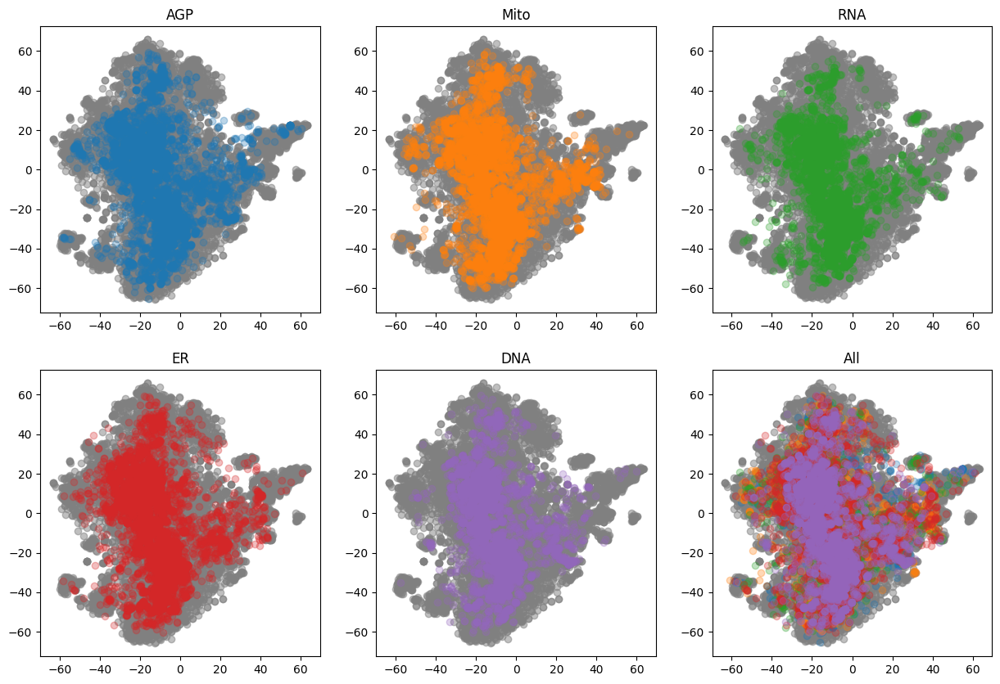

In [4]:
fig, ax = plt.subplots(2,3, figsize=(15,10))

for i, ch in enumerate(chnls):
    t = tsne_embeddings[ch]
    
    if i == 0:
        ax.flatten()[-1].scatter(bt[:,0], bt[:,1], alpha=0.5, label='Original', color=colors[0])
        ax.flatten()[-1].set_title("All")

    ax.flatten()[i].scatter(bt[:,0], bt[:,1], alpha=0.5, label='Original', color=colors[0])
    ax.flatten()[i].scatter(t[:,0], t[:,1], alpha=0.3, label=ch, color=colors[i + 1])
    ax.flatten()[i].set_title(str(ch))

    ax.flatten()[-1].scatter(t[:,0], t[:,1], alpha=0.3, label=ch, color=colors[i + 1])

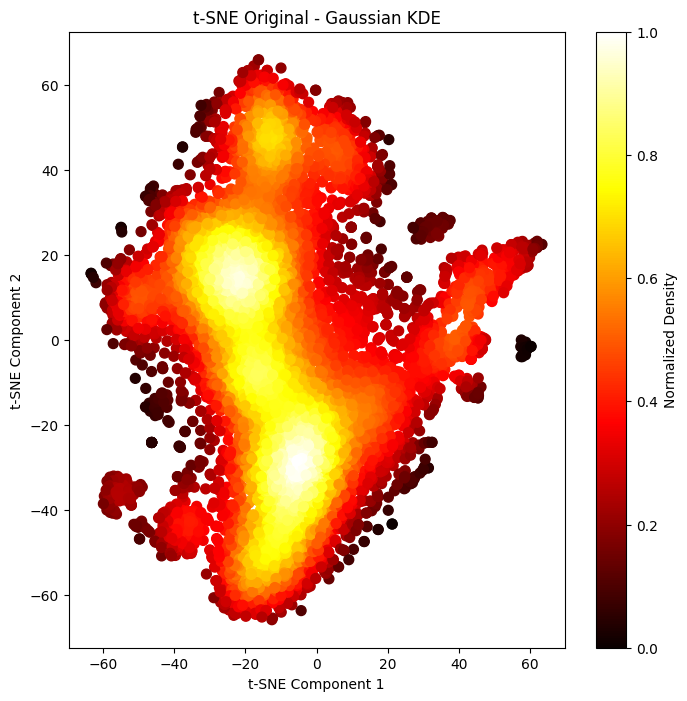

In [5]:
x = bt[:, 0]
y = bt[:, 1]
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

z_normalized = (z - z.min()) / (z.max() - z.min())

plt.figure(figsize=(8, 8))
plt.scatter(x, y, c=z_normalized, cmap='hot', s=50)
plt.colorbar(label='Normalized Density')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Original - Gaussian KDE')
plt.show()

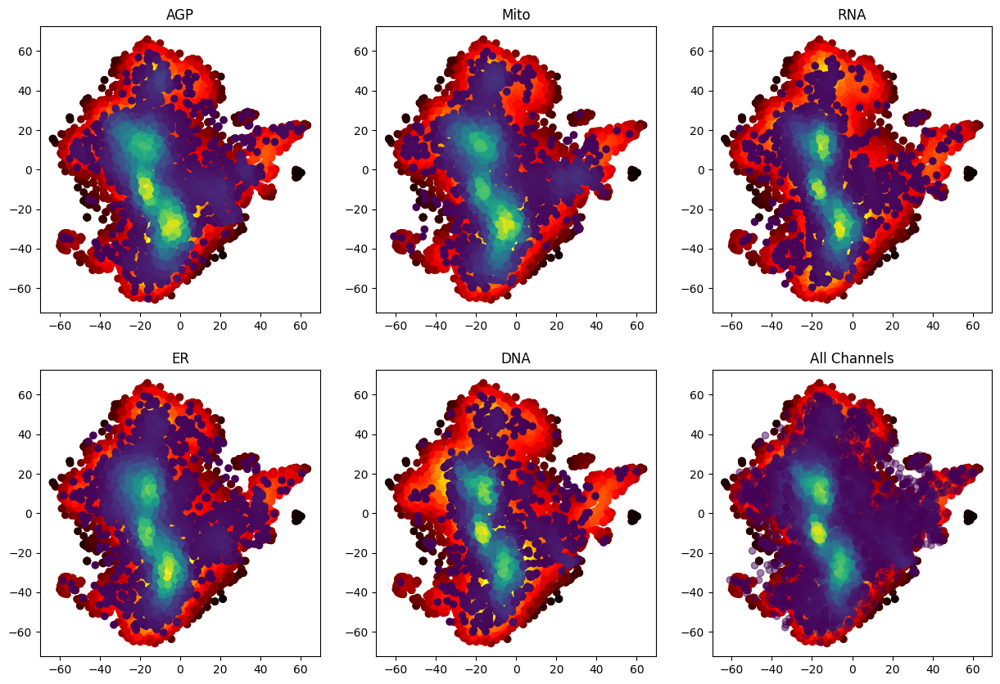

In [6]:
fig, ax = plt.subplots(2,3, figsize=(15,10))

x1 = bt[:, 0]
y1 = bt[:, 1]
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
z1_normalized = (z1 - z1.min()) / (z1.max() - z1.min())

all_x2 = []
all_y2 = []
all_z2_normalized = []

for i, ch in enumerate(chnls):
    t = tsne_embeddings[ch]
    x2 = t[:, 0]
    y2 = t[:, 1]
    xy2 = np.vstack([x2, y2])
    z2 = gaussian_kde(xy2)(xy2)
    z2_normalized = (z2 - z2.min()) / (z2.max() - z2.min())

    ax.flatten()[i].scatter(x1, y1, c=z1_normalized, cmap='hot', label='Original')
    ax.flatten()[i].scatter(x2, y2, c=z2_normalized, cmap='viridis', label=ch)
    ax.flatten()[i].set_title(str(ch))

    all_x2.extend(x2)
    all_y2.extend(y2)
    all_z2_normalized.extend(z2_normalized)

ax.flatten()[-1].scatter(x1, y1, c=z1_normalized, cmap='hot', label='Original')
ax.flatten()[-1].scatter(all_x2, all_y2, c=all_z2_normalized, cmap='viridis', label='All Channels', alpha=0.5)
ax.flatten()[-1].set_title('All Channels')

plt.show()

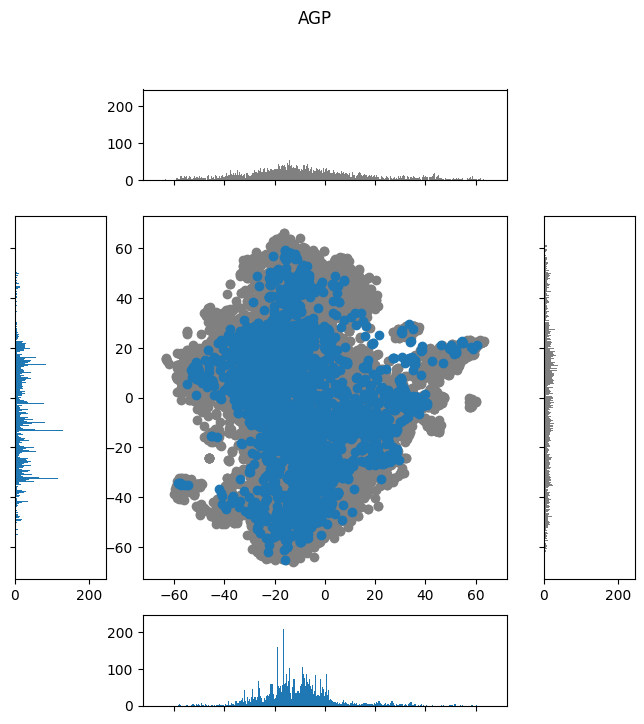

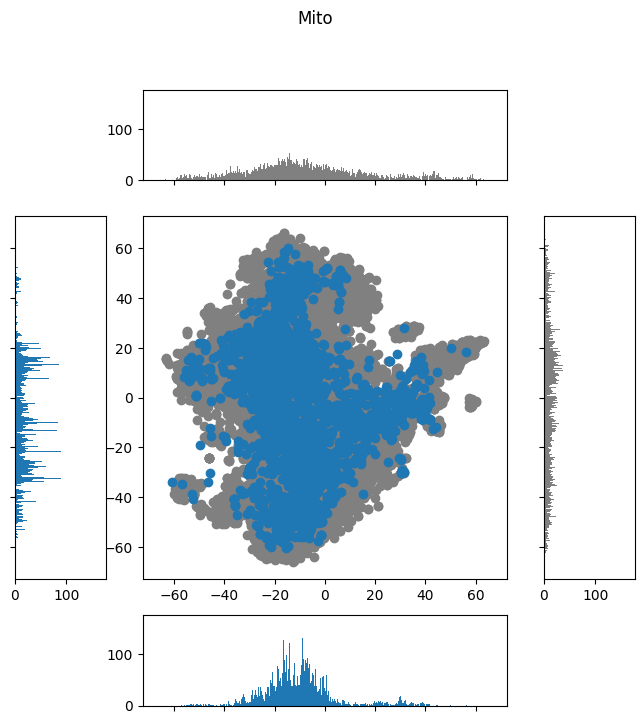

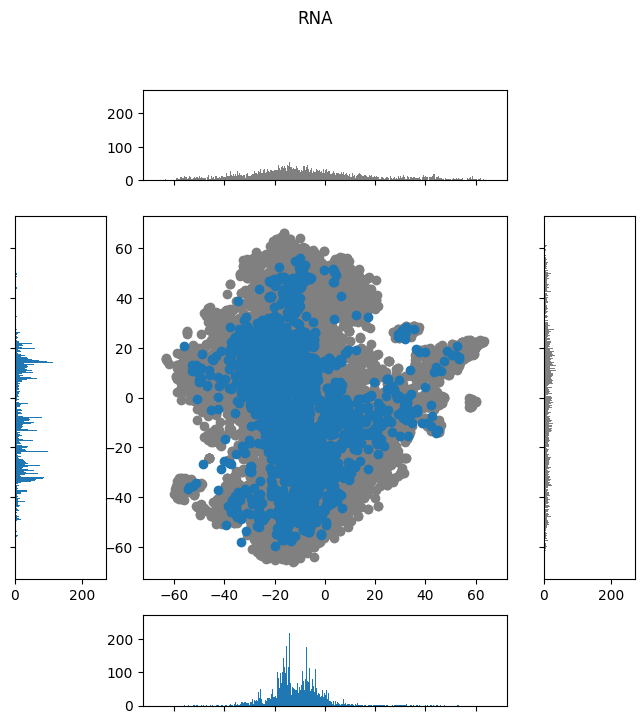

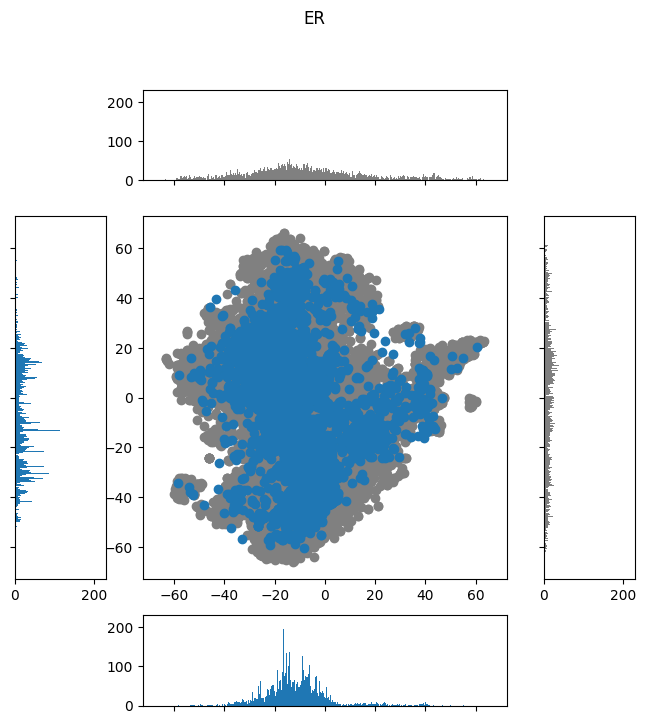

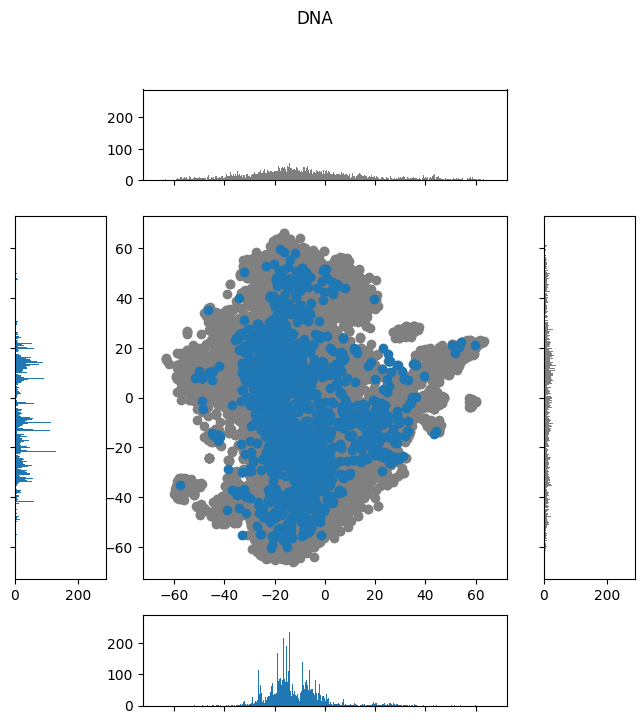

In [7]:
x = bt[:, 0]
y = bt[:, 1]

for ch in chnls:

    ct = tsne_embeddings[ch]
    cx = ct[:, 0]
    cy = ct[:, 1]

    fig = plt.figure(figsize=(8, 8))
    fig.suptitle(ch)
    gs = fig.add_gridspec(3, 3, width_ratios=(1, 4, 1), height_ratios=(1, 4, 1))

    ax = fig.add_subplot(gs[1, 1])
    ax_histx1 = fig.add_subplot(gs[0, 1], sharex=ax)
    ax_histy1 = fig.add_subplot(gs[1, 2], sharey=ax)

    ax_histx2 = fig.add_subplot(gs[2, 1], sharex=ax)
    ax_histy2 = fig.add_subplot(gs[1, 0], sharey=ax)

    ax_histx1.tick_params(axis="x", labelbottom=False)
    ax_histy1.tick_params(axis="y", labelleft=False)

    ax.scatter(x, y, color=colors[0])
    ax.scatter(cx, cy, color=colors[1])

    binwidth = 0.25
    xymax = max(np.max(np.abs(x)), np.max(np.abs(y)), np.max(np.abs(cx)), np.max(np.abs(cy)))
    lim = (int(xymax / binwidth) + 1) * binwidth

    bins = np.arange(-lim, lim + binwidth, binwidth)
    counts_x, _ = np.histogram(np.concatenate([x, cx]), bins=bins)
    counts_y, _ = np.histogram(np.concatenate([y, cy]), bins=bins)

    max_count = max(max(counts_x), max(counts_y))

    ax_histx1.hist(x, bins=bins, color=colors[0])
    ax_histy1.hist(y, bins=bins, color=colors[0], orientation='horizontal')
    ax_histx2.hist(cx, bins=bins, color=colors[1])
    ax_histy2.hist(cy, bins=bins, color=colors[1], orientation='horizontal')

    ax_histx1.set_ylim(0, max_count)
    ax_histy1.set_xlim(0, max_count)
    ax_histx2.set_ylim(0, max_count)
    ax_histy2.set_xlim(0, max_count)

    ax_histx2.tick_params(axis="x", labelbottom=False)
    ax_histy2.tick_params(axis="y", labelleft=False)

    plt.show()

# Treatment level

Mean features grouped by treatment (Example: `BRD-A62421304-004-05-6@2.373335218077941`, `Negative@0`)


In [8]:
baseline_tf = pd.read_csv(f"features/{original}_wells.csv").groupby("Treatment").mean().reset_index()[f_cols]
channel_tf = {ch: pd.read_csv(f"features/{ch}_wells.csv").groupby("Treatment").mean().reset_index()[f_cols] for ch in channels}

open_tsne = TSNE()
bt_tf = open_tsne.fit(np.array(baseline_tf))
tsne_embeddings_tf = {ch: bt_tf.transform(np.array(f)) for ch, f in channel_tf.items()}

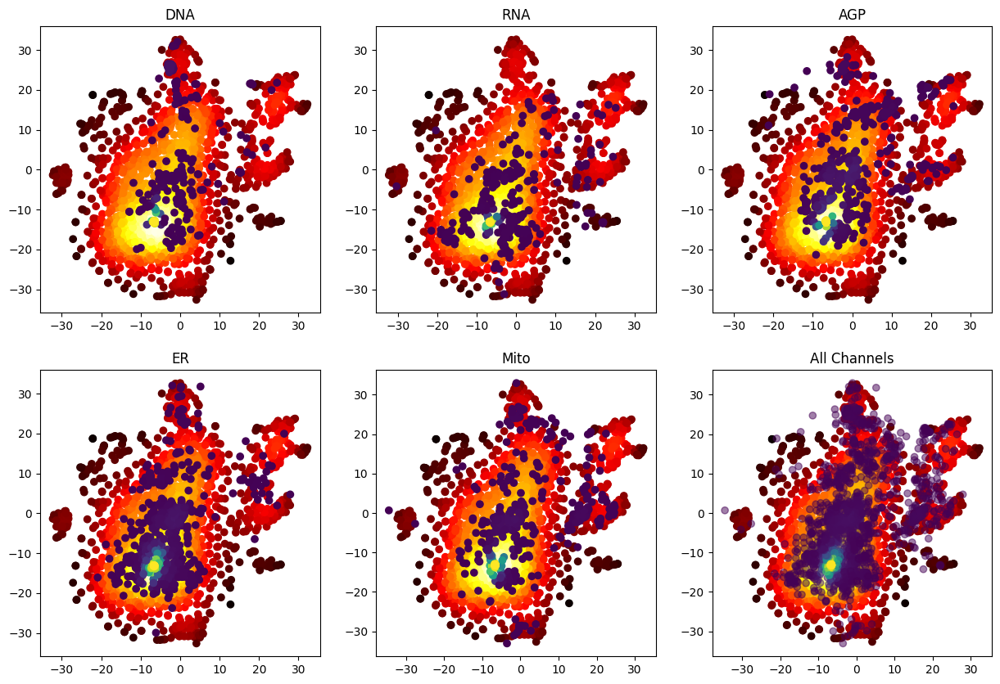

In [9]:
fig, ax = plt.subplots(2,3, figsize=(15,10))

x1 = bt_tf[:, 0]
y1 = bt_tf[:, 1]
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
z1_normalized = (z1 - z1.min()) / (z1.max() - z1.min())

all_x2 = []
all_y2 = []
all_z2_normalized = []

for i, ch in enumerate(tsne_embeddings_tf.keys()):
    t = tsne_embeddings_tf[ch]
    x2 = t[:, 0]
    y2 = t[:, 1]
    xy2 = np.vstack([x2, y2])
    z2 = gaussian_kde(xy2)(xy2)
    z2_normalized = (z2 - z2.min()) / (z2.max() - z2.min())

    ax.flatten()[i].scatter(x1, y1, c=z1_normalized, cmap='hot', label='Original')
    ax.flatten()[i].scatter(x2, y2, c=z2_normalized, cmap='viridis', label=ch)
    ax.flatten()[i].set_title(str(ch))

    all_x2.extend(x2)
    all_y2.extend(y2)
    all_z2_normalized.extend(z2_normalized)

ax.flatten()[-1].scatter(x1, y1, c=z1_normalized, cmap='hot', label='Original')
ax.flatten()[-1].scatter(all_x2, all_y2, c=all_z2_normalized, cmap='viridis', label='All Channels', alpha=0.5)
ax.flatten()[-1].set_title('All Channels')

plt.show()

In [ ]:
from scipy.interpolate import griddata

baseline_features_df = pd.read_csv(f"features/{original}_wells.csv")
baseline_features_df = baseline_features_df[["Treatment"]]

baseline_features_df.loc[:, "tsne_x"] = list(bt[:, 0])
baseline_features_df.loc[:, "tsne_y"] = list(bt[:, 1])

# Compute the ratio between dimensions
ratio = bt[:, 0] / bt[:, 1]

# Take the absolute value of the ratio to handle negative values
abs_ratio = np.abs(ratio)

# Take the logarithm of the absolute ratio
log_ratio = np.log(abs_ratio)

# Plot scatter plot with log_ratio as heatmap color
plt.figure(figsize=(8, 6))
plt.scatter(bt[:, 0], bt[:, 1], c=log_ratio, cmap='viridis', alpha=0.7)
plt.colorbar(label='Log Ratio')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('Scatter Plot with Log Ratio as Heatmap Color')
plt.show()

## K-nearest Neighbors

In [9]:
from sklearn.neighbors import NearestNeighbors

ch = "DNA"

# Step 2: Find k-nearest neighbors
k = 5
nbrs1 = NearestNeighbors(n_neighbors=k+1).fit(bt)
nbrs2 = NearestNeighbors(n_neighbors=k+1).fit(tsne_embeddings[ch])

distances1, indices1 = nbrs1.kneighbors(bt)
distances2, indices2 = nbrs2.kneighbors(tsne_embeddings[ch])

# Note: indices1 and indices2 include the point itself as the first neighbor

# Step 3: Compare neighbors
for i in range(len(bt)):
    neighbors1 = indices1[i, 1:]  # Exclude the point itself
    neighbors2 = indices2[i, 1:]  # Exclude the point itself
    
    print(f"Point {i} in Set 1: Neighbors -> {neighbors1}")
    print(f"Point {i} in Set 2: Neighbors -> {neighbors2}")

    common_neighbors = np.intersect1d(neighbors1, neighbors2)
    print(f"Common neighbors for point {i}: {common_neighbors}\n")

Point 0 in Set 1: Neighbors -> [2046 3822  477 6881 5733]
Point 0 in Set 2: Neighbors -> [6286 2046 2860  390 4793]
Common neighbors for point 0: [2046]

Point 1 in Set 1: Neighbors -> [ 95 191   2 239   3]
Point 1 in Set 2: Neighbors -> [2485 1521 3071  704  624]
Common neighbors for point 1: []

Point 2 in Set 1: Neighbors -> [ 95   1   3 191  49]
Point 2 in Set 2: Neighbors -> [4924 3821 1145 4632 6225]
Common neighbors for point 2: []

Point 3 in Set 1: Neighbors -> [ 49  96   2 191   1]
Point 3 in Set 2: Neighbors -> [2572   34 1734  416 5804]
Common neighbors for point 3: []

Point 4 in Set 1: Neighbors -> [ 95  47 143   1   2]
Point 4 in Set 2: Neighbors -> [3012 2489 4960 1040 1637]
Common neighbors for point 4: []

Point 5 in Set 1: Neighbors -> [ 47 101  11 143   4]
Point 5 in Set 2: Neighbors -> [5751 3100 6275 6492 3823]
Common neighbors for point 5: []

Point 6 in Set 1: Neighbors -> [ 17  15  66  18 335]
Point 6 in Set 2: Neighbors -> [6116  762 5633 2291 3982]
Common nei

# Streamplot

- Used to display 2D vector field
- Parameters:
    - `X`, `Y`: values (for each of the 2 axis) of OpenTSNE embeddings of original features
    - `U`, `V`: substracting x, y coordinates from Original and Channel embeddings. Represent directinal changes from Original to Channel embeddings

In [11]:
def get_streamplot(bt, ct):
    """Create a vector field representation for 2D data. Calculates the difference between two sets of features and then interpolates these vector differences
    onto a regular grid."""

    X, Y = bt[:, 0], bt[:, 1]
    U, V = ct[:, 0] - bt[:, 0], ct[:, 1] - bt[:, 1]

    # Grid over the embedding space
    grid_x, grid_y = np.linspace(min(X), max(X), 100), np.linspace(min(Y), max(Y), 100)
    grid_u, grid_v = np.meshgrid(grid_x, grid_y)

    # Interpolating the vector data onto the grid
    velocity_u = griddata((X, Y), U, (grid_u, grid_v), method='nearest')
    velocity_v = griddata((X, Y), V, (grid_u, grid_v), method='nearest')

    # Handle NaN values if necessary
    velocity_u = np.nan_to_num(velocity_u)
    velocity_v = np.nan_to_num(velocity_v)

    return grid_x, grid_y, velocity_u, velocity_v

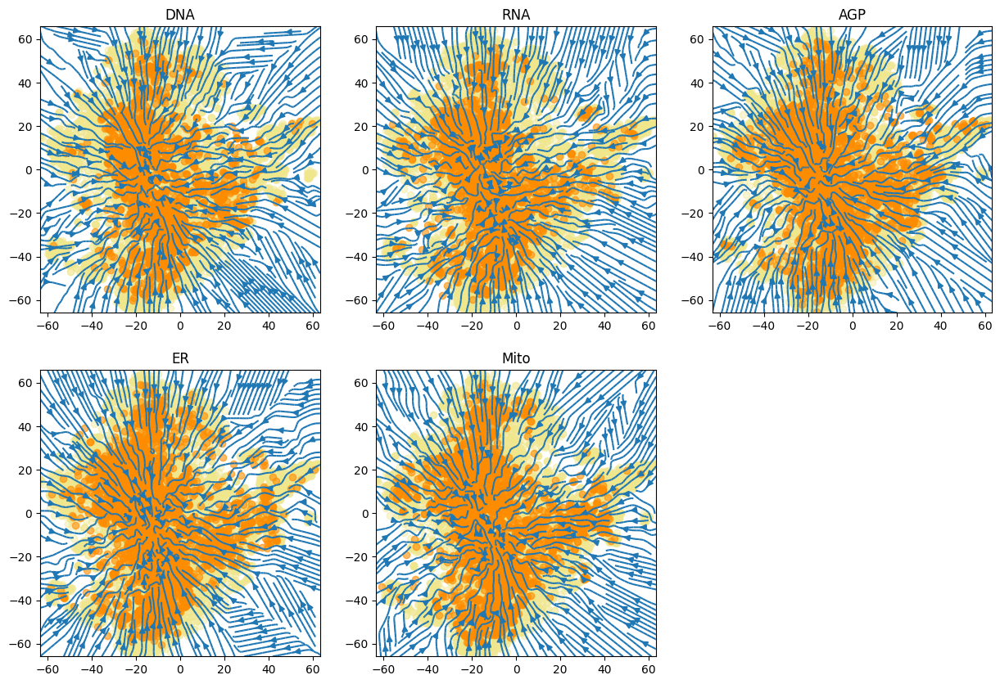

In [12]:
fig, ax = plt.subplots(2,3, figsize=(15,10))
ax.flat[-1].set_visible(False)

for i, ch in enumerate(tsne_embeddings.keys()):
    ct = tsne_embeddings[ch]
    grid_x, grid_y, velocity_u, velocity_v = get_streamplot(bt, ct)   
    
    ax.flat[i].streamplot(grid_x, grid_y, velocity_u, velocity_v, density=2)
    ax.flat[i].set_title(str(ch))
    ax.flat[i].scatter(bt[:, 0], bt[:, 1], color='khaki', alpha=0.4)
    ax.flat[i].scatter(ct[:, 0], ct[:, 1], color='darkorange', alpha=0.6)

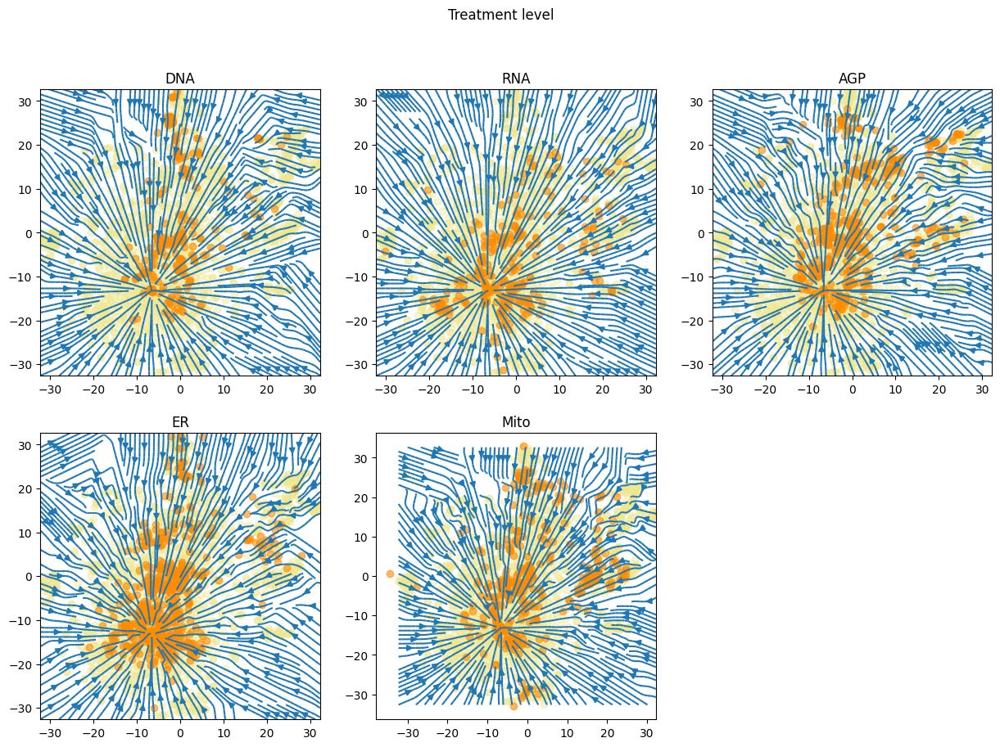

In [13]:
fig, ax = plt.subplots(2,3, figsize=(15,10))
fig.suptitle("Treatment level")
ax.flat[-1].set_visible(False)

for i, ch in enumerate(tsne_embeddings_tf.keys()):
    ct = tsne_embeddings_tf[ch]
    grid_x, grid_y, velocity_u, velocity_v = get_streamplot(bt_tf, ct)   
    
    ax.flat[i].streamplot(grid_x, grid_y, velocity_u, velocity_v, density=2)
    ax.flat[i].set_title(str(ch))
    ax.flat[i].scatter(bt_tf[:, 0], bt_tf[:, 1], color='khaki', alpha=0.4)
    ax.flat[i].scatter(ct[:, 0], ct[:, 1], color='darkorange', alpha=0.6)

# Tricountours

- `Triangulation`: organizes random data points into a triangular mesh

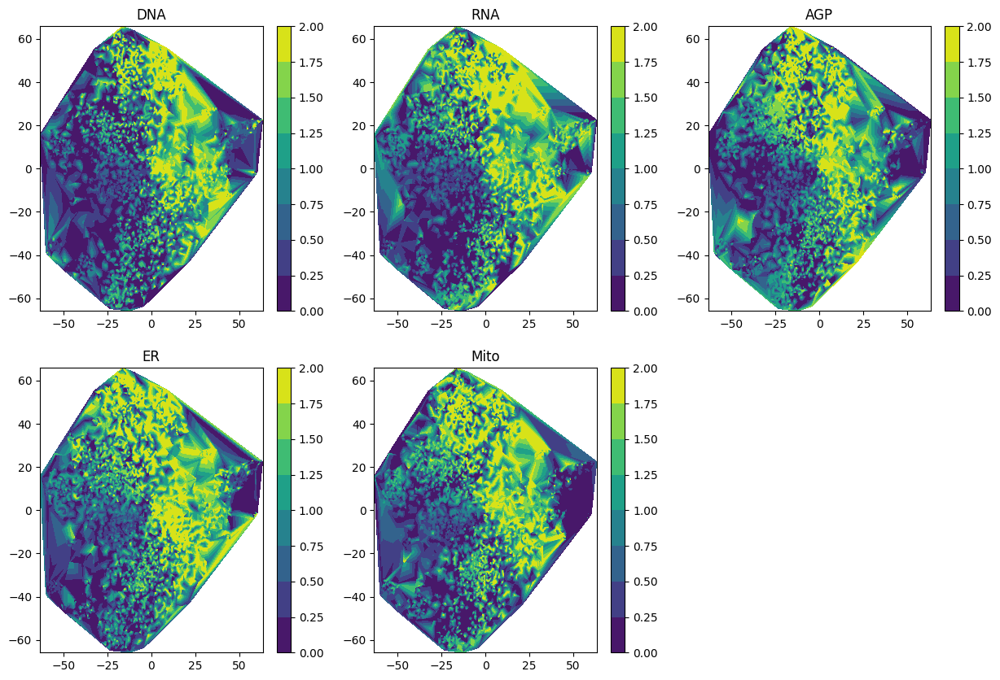

In [14]:
X, Y = bt[:, 0], bt[:, 1]
triang = tri.Triangulation(X, Y)

fig, ax = plt.subplots(2,3, figsize=(15,10))
ax.flat[-1].set_visible(False)

for i, ch in enumerate(tsne_embeddings.keys()):
    ct = tsne_embeddings[ch]
    Z = cosine_distances(bt, ct)
    cntr = ax.flat[i].tricontourf(triang, Z.diagonal())
    plt.colorbar(cntr, ax=ax.flat[i])
    ax.flat[i].set_title(str(ch))

# KDE - Kernel Density Estimation

- `seaborn.sns.kdeplot`: Plot each set of (7664x2) features/embeddings from OpenTSNE.

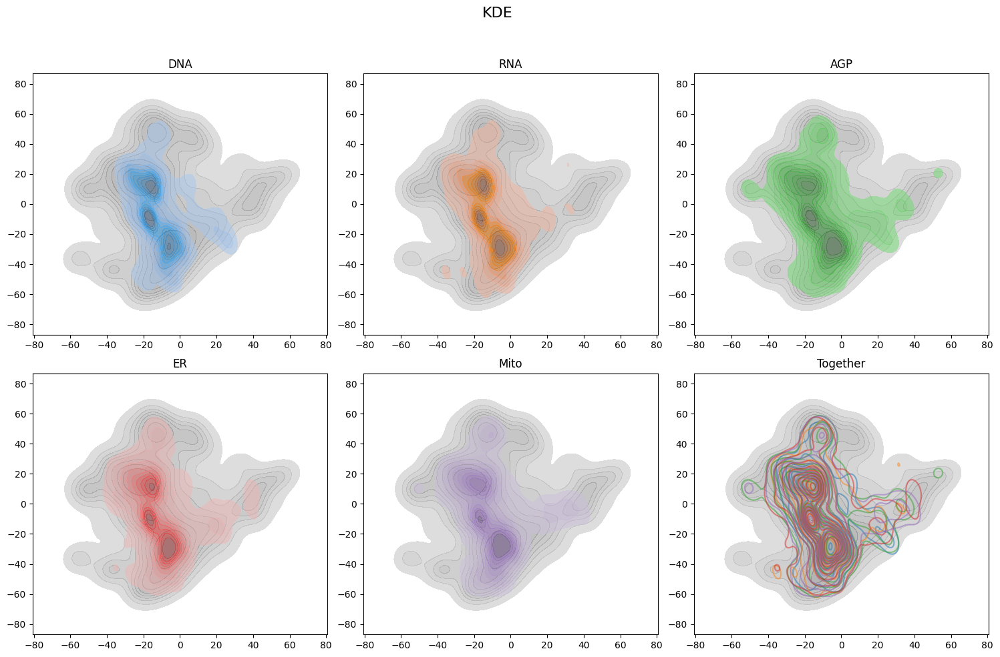

In [15]:
fig, ax = plt.subplots(2,3, figsize=(15,10))

for i, ch in enumerate(tsne_embeddings.keys()):
    ct = tsne_embeddings[ch]
    
    sns.kdeplot(x=bt[:, 0], y=bt[:, 1], color=colors[0], ax=ax.flat[i], fill=True, alpha=0.5)
    sns.kdeplot(x=ct[:, 0], y=ct[:, 1], color=colors[i + 1], ax=ax.flat[i], fill=True, alpha=0.5)
    ax.flat[i].set_title(str(ch))

    if i == 0:
        sns.kdeplot(x=bt[:, 0], y=bt[:, 1], color=colors[0], ax=ax.flat[-1], fill=True, alpha=0.5)
        ax.flat[-1].set_title("Together")
    sns.kdeplot(x=ct[:, 0], y=ct[:, 1], color=colors[i + 1], ax=ax.flat[-1], fill=False, alpha=0.5)

fig.suptitle("KDE", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)

# Optimal Leaf Ordering

In [16]:
# Compute the pairwise distances between cells
distance_matrix = pdist(bt, metric='cosine')

# Step 2: Perform the hierarchical clustering
linked = linkage(distance_matrix, method='ward')

# Step 3: Optimal leaf ordering
ordered_linked = optimal_leaf_ordering(linked, distance_matrix)

plt.figure(figsize=(10, 7))
dendrogram(ordered_linked)
plt.title('Hierarchical Clustering with Optimal Leaf Ordering')

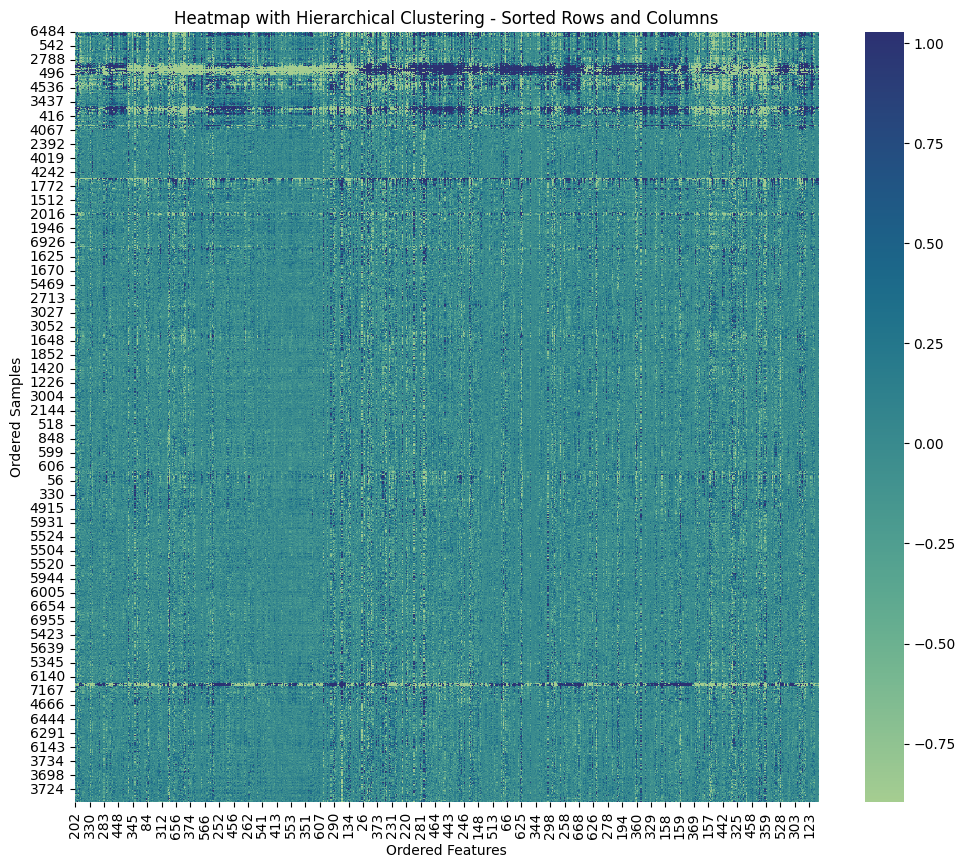

In [4]:
def heatmap_order_features(features):
    # Compute the pairwise distances between rows and columns
    row_distances = pdist(features, metric='cosine')
    col_distances = pdist(features.T, metric='cosine')

    # Perform hierarchical clustering for rows and columns separately
    row_clusters = linkage(row_distances, method='ward')
    col_clusters = linkage(col_distances, method='ward')

    # Obtain the order of rows and columns according to the clustering
    row_order = leaves_list(row_clusters)
    col_order = leaves_list(col_clusters)

    # Reorder the DataFrame according to the clustering for rows and columns
    ordered_features = features.iloc[row_order, col_order]

    return ordered_features

# Assuming baseline_features is defined
bh = heatmap_order_features(baseline_features)

plt.figure(figsize=(12, 10))
sns.heatmap(bh, cmap='crest', robust=True)
plt.title('Heatmap with Hierarchical Clustering - Sorted Rows and Columns')
plt.xlabel('Ordered Features')
plt.ylabel('Ordered Samples')
plt.show()

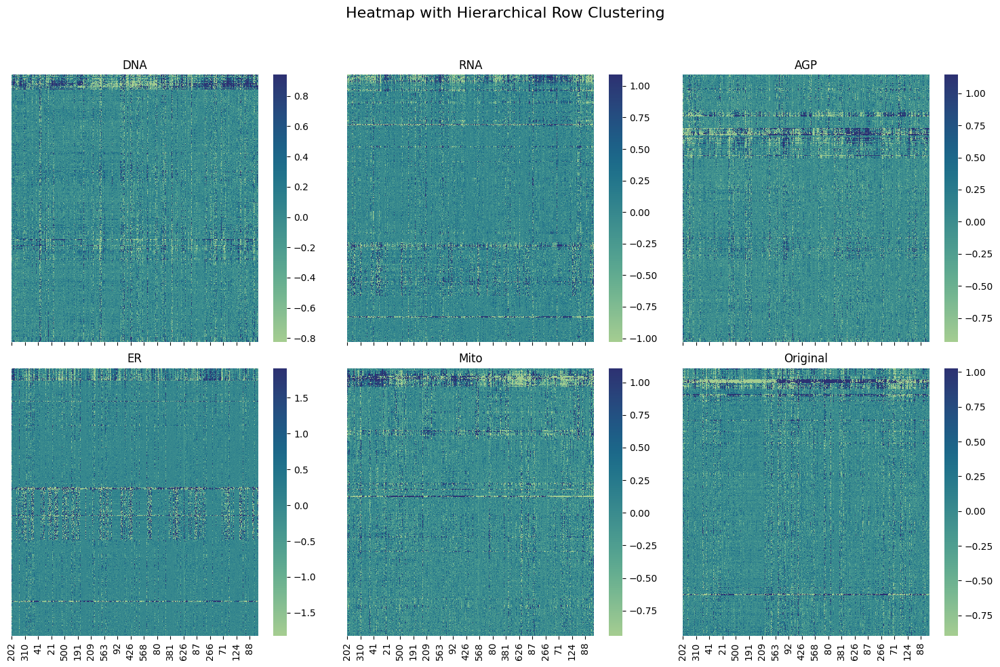

In [5]:
fig, ax = plt.subplots(2,3, figsize=(15,10), sharex=True)

for i, ch in enumerate(channel_features.keys()):
    
    ch_hm = heatmap_order_features(channel_features[ch])
    sns.heatmap(ch_hm, cmap='crest', yticklabels=False, robust=True, ax=ax.flat[i])    
    ax.flat[i].set_title(str(ch))

ax.flat[-1].set_title("Original")
sns.heatmap(bh, cmap='crest', yticklabels=False, robust=True, ax=ax.flat[-1])    

fig.suptitle("Heatmap with Hierarchical Row Clustering", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
plt.show()

# Mean differences between sets of features

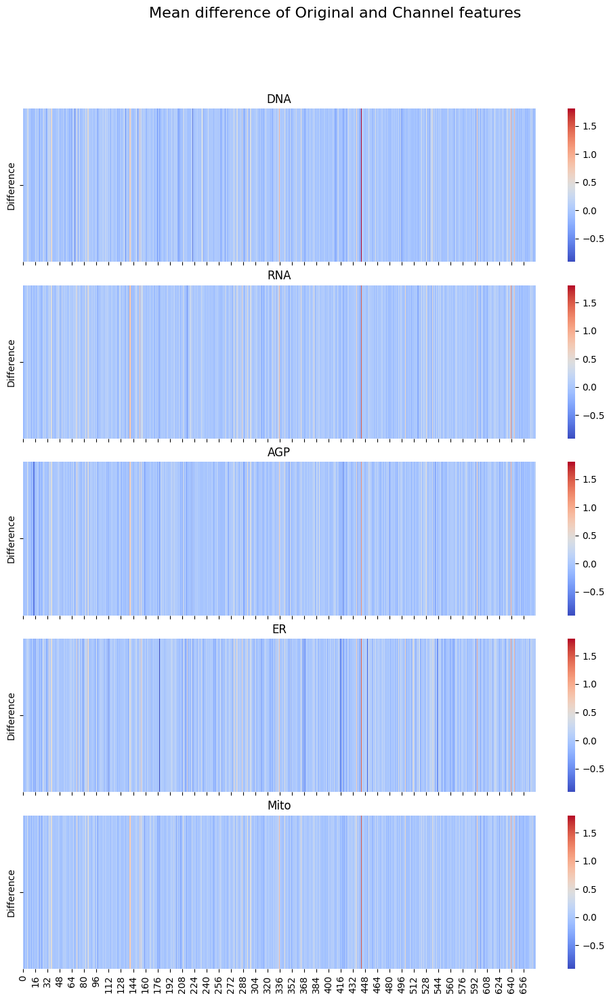

In [6]:
global_min = float('inf')
global_max = float('-inf')

for ch in channel_features.keys():
    mean_diff = (baseline_features - channel_features[ch]).mean(axis=0)
    global_min = min(global_min, mean_diff.min())
    global_max = max(global_max, mean_diff.max())

fig, ax = plt.subplots(5,1, figsize=(10,15), sharex=True, sharey=True)

for i, ch in enumerate(channel_features.keys()):

    mean_diff = pd.DataFrame((baseline_features - channel_features[ch]).mean(axis=0), columns=['Difference']).transpose()
    sns.heatmap(mean_diff, cmap='coolwarm', ax=ax[i], vmin=global_min, vmax=global_max)
    ax.flat[i].set_title(str(ch))

fig.suptitle("Mean difference of Original and Channel features", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)

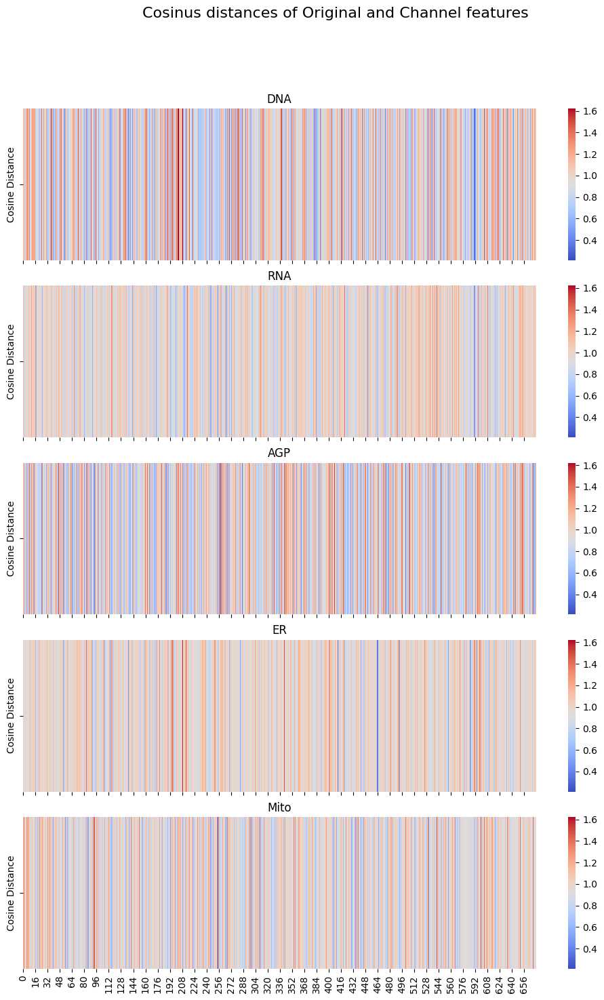

In [7]:
global_min = float('inf')
global_max = float('-inf')

for ch in channel_features.keys():
    cos_distances = [cosine(baseline_features.iloc[:, i], channel_features[ch].iloc[:, i]) for i in range(baseline_features.shape[1])]
    global_min = min(global_min, min(cos_distances))
    global_max = max(global_max, max(cos_distances))

fig, ax = plt.subplots(5,1, figsize=(10,15), sharex=True, sharey=True)

for i, ch in enumerate(channel_features.keys()):
    cos_distances = pd.DataFrame(np.array([cosine(baseline_features.iloc[:, i], channel_features[ch].iloc[:, i]) for i in range(baseline_features.shape[1])]), columns=['Cosine Distance'])
    sns.heatmap(cos_distances.T, cmap='coolwarm', ax=ax[i], vmin=global_min, vmax=global_max)
    ax.flat[i].set_title(str(ch))

fig.suptitle("Cosinus distances of Original and Channel features", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)


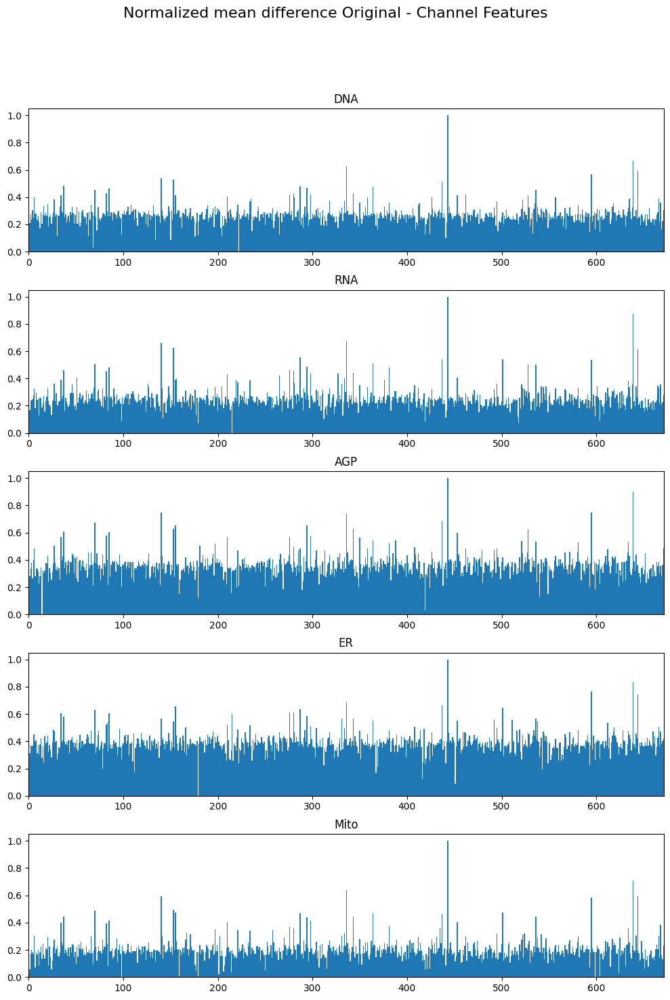

In [8]:
fig, ax = plt.subplots(5,1, figsize=(10,15))

for i, ch in enumerate(channel_features.keys()):
    
    mean_diff = (np.array(baseline_features) - np.array(channel_features[ch])).mean(axis=0)
    mean_diff_norm = ((mean_diff - mean_diff.min()) / (mean_diff.max() - mean_diff.min()))

    ax.flat[i].bar(list(range(672)), mean_diff_norm, width=1)
    ax.flat[i].set_title(str(ch))
    ax.flat[i].margins(x=0)

fig.suptitle("Normalized mean difference Original - Channel Features", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)

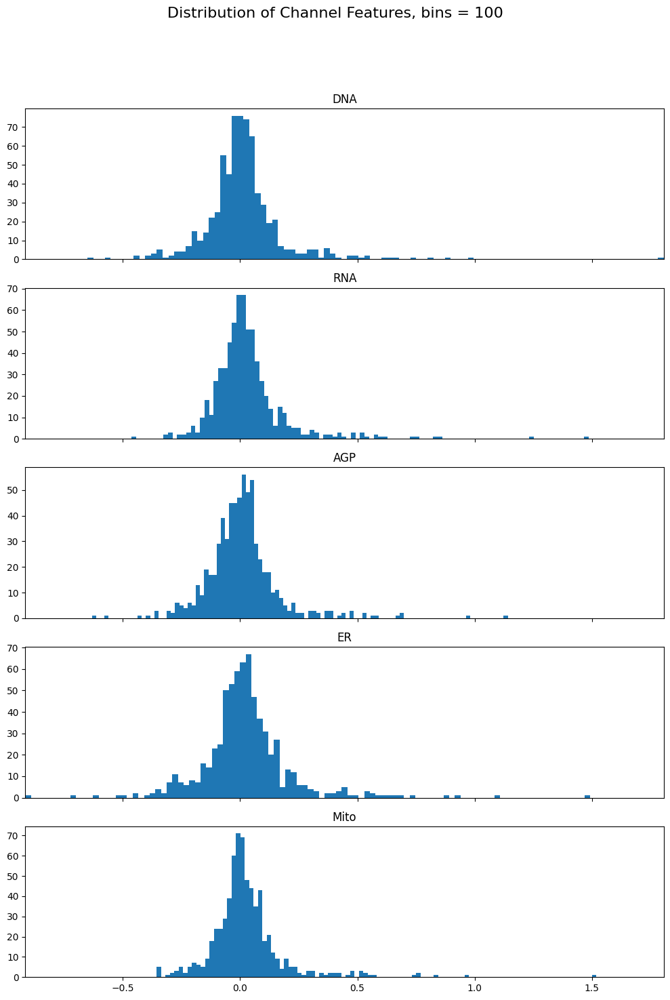

In [9]:
bins = 100

fig, ax = plt.subplots(5,1, figsize=(10,15), sharex=True)

for i, ch in enumerate(channel_features.keys()):

    mean_diff = (np.array(baseline_features) - np.array(channel_features[ch])).mean(axis=0)
    ax.flat[i].hist(mean_diff, bins=bins)
    ax.flat[i].set_title(str(ch))
    ax.flat[i].margins(x=0)

fig.suptitle(f"Distribution of Channel Features, bins = {bins}", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)